# The Battle of Neighborhoods- Opening Café in  Kuala Lumpur

Due to unique environment of Kuala Lumpur, it is a bit tricky to identify and define the city's key area. For the purpose of IBM Capstone Project, we will use Government clinics and private hospitals as a key interest area in the city. 

As the Government need to ensure health services are accessible to the community, they need to ensure that governmental clinic are deployed at the strategic location. Thus, these logics is sufficient for us to use governmental clinics as key interest point of the City of Kuala Lumpur, Malaysia.

In [1]:
!pip install beautifulsoup4 
!pip install lxml 
!pip install html5lib
!pip install requests
!pip install bingmaps
!pip install geopy
!pip install folium
!pip install here-location-services

### 1. Import the necessary package

In [2]:
import requests
from bs4 import BeautifulSoup
import pandas as pd
from bingmaps.apiservices import LocationByAddress
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
import folium # for map randering
import numpy as np # library to handle data in a vectorized manner
from sklearn.cluster import KMeans
# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors
import json
import numpy as np
import matplotlib.pyplot as plt 
from sklearn.cluster import KMeans
from sklearn import datasets
%matplotlib inline

HERE Location Services API key:

In [3]:
hkey='xxxx'

Foursquare API key:

In [4]:
CLIENT_ID = 'xxxxx' # your Foursquare ID
CLIENT_SECRET = 'xxxxx' # your Foursquare Secret
ACCESS_TOKEN = 'xxxxx' # your FourSquare Access Token
VERSION = '20180604'
LIMIT = 30
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 4HIQI2HWJZMBDSKBOVE1W1SONYAU5S0F4XRLJSB5XGX5FRIO
CLIENT_SECRET:5ZBC3W3EANMH01EDD3W4MSGYG0TVIM5NPPDZ4HXVTD234DLQ


### 2. Set parameter and inititate web scraping using pandas looking for table

For this purpose, we will utilize dataset from Ministry of Health official website listing of all government clinics in Kuala Lumpur

In [5]:
url1='https://www.moh.gov.my/index.php/database_stores/store_view/1?search=Kuala+lumpur&items=25&page=1'
url2='https://www.moh.gov.my/index.php/database_stores/store_view/1?search=Kuala+lumpur&items=25&page=2'

In [6]:
tables1 = pd.read_html(url1)
tables2 = pd.read_html(url2)
print('Tables found:', len(tables1))

Tables found: 4


In [7]:
#we identified the first table is the one that we are looking for and append them
t1 = tables1[2]  
t2 = tables2[2]
df0 = t1.append([t2])
df0 = df0.drop(['No.'], axis = 1) #drop No.

df0.reset_index(drop=True, inplace=True) #reset index

df0.head()

,Nama Klinik,Alamat 1,Bandar,Negeri,Unnamed: 5
0,Klinik Kesihatan AU2,Taman Seri Keramat,Ampang,Selangor,NaN
1,Klinik Kesihatan Bandar Tun Razak,"No. 16 & 18 Jalan Jujur 3, Bandar Tun Razak",Kuala Lumpur,WP Kuala Lumpur,NaN
2,Klinik Kesihatan Batu,"Lot 98 Tingkat 1, Batu 4 1/2, Jalan Ipoh",Kuala Lumpur,WP Kuala Lumpur,NaN
3,Klinik Kesihatan Cheras,"Tkt 9, Tower 2, Menara PGRM, No 8 Jalan Pulu Ulu",Cheras,WP Kuala Lumpur,NaN
4,Klinik Kesihatan Cheras Baru,Jalan 16 Kampung Cheras Baru,Cheras Baru,WP Kuala Lumpur,NaN


The data from government clinic will be supplemented with data from Wikipedia on private hospital. The data has been scrapped before in CSV file thus, we just import it from github.

In [8]:
url3='https://raw.githubusercontent.com/azrulihsan/IBM_Capstone_Project/master/Week%204%20Battle%20of%20Neighborhood/KL%20Private%20Hospitals.csv'

In [9]:
df = pd.read_csv(url3,encoding='latin1')
df.head()

,Hospital,Address
0,iHEAL Medical Centre,"Level 7 & 8, Annexe Block, Menara IGB, Lingkar..."
1,Global Doctors Hospital,"18, Jln Kiara 3, Mont Kiara, 50480 Kuala Lumpu..."
2,Columbia Asia Hospital - Setapak,"No. 1, Jalan Danau Saujana, Taman Danau Kota, ..."
3,Prince Court Medical Centre,"39, Jalan Kia Peng, Kuala Lumpur, 50450 Kuala ..."
4,ALPS Medical Centre,"Menara See Hoy Chan, 02-03 and 02-04, 374, Jln..."


We are combining both tables on government clinics and private hospital by picking up name of the clinic/ hospital and corresponding address

In [10]:
for i, row in df0.iterrows():
    clinic = f"{row['Nama Klinik']}"
    address = f"{row['Alamat 1']}"
    city = f"{row['Bandar']}"
    state = f"{row['Negeri']}"
    df = df.append({'Hospital': str(clinic),'Address': address+","+city+","+state},ignore_index=True)
df

,Hospital,Address
0,iHEAL Medical Centre,"Level 7 & 8, Annexe Block, Menara IGB, Lingkar..."
1,Global Doctors Hospital,"18, Jln Kiara 3, Mont Kiara, 50480 Kuala Lumpu..."
2,Columbia Asia Hospital - Setapak,"No. 1, Jalan Danau Saujana, Taman Danau Kota, ..."
3,Prince Court Medical Centre,"39, Jalan Kia Peng, Kuala Lumpur, 50450 Kuala ..."
4,ALPS Medical Centre,"Menara See Hoy Chan, 02-03 and 02-04, 374, Jln..."
...,...,...
61,Klinik Kesihatan Petaling Bahagia,"Batu 6, Jalan Puchong,Kuala Lumpur,WP Kuala Lu..."
62,Klinik Kesihatan Sentul,"Tingkat 2, Kompleks Perniagaan & Komuniti, Jal..."
63,Klinik Kesihatan Setapak,"No. 26/28 Jln. 9/23A, Medan Makmur Off Jalan U..."
64,Klinik Kesihatan Sungai Besi,"Jalan Pekan Sungai Besi,Sungai Besi,WP Kuala L..."


With this, we have collected 64 clinics and hospital around Kuala Lumpur

### 3. KL Data Extraction and Cleanup

We will find location (longitude and latitude) for each address using HERE Location Services API. 

For this, We will get the intended header ready first.

In [11]:
# define the dataframe columns
column_names = ['Area','Clinic/Hospital','Address','City','State','Latitude', 'Longitude','LongLat'] 

# instantiate the dataframe
df1 = pd.DataFrame(columns=column_names)

In [12]:
#checking header of empty Dataframe.
df1.head()

,Area,Clinic/Hospital,Address,City,State,Latitude,Longitude,LongLat


From addresses of government clinics, we will get the coordinate for each of them. The objective is to use all these clinics/hospitals as a centroid to key areas in Kuala Lumpur. The data will be extracted in Json format thus, we need to get the relevant information only.

lets analyze JSON data extracted from HERE Location Services API

In [13]:
import json
import os
from here_location_services import LS

LS_API_KEY = hkey # Get API KEY from environment.
ls = LS(api_key=LS_API_KEY)
address ='Klinik Kesihatan Bandar Tun Razak, No. 16 & 18 Jalan Jujur 3, Bandar Tun Razak, Kuala Lumpur WP Kuala Lumpur, Malaysia'
geo = ls.geocode(query=address)
geo1= (json.dumps(geo.to_geojson()))
geo2= (json.dumps(geo.to_geojson(), indent=2, sort_keys=True))
geo3= json.loads(geo2)
geo3

{'features': [{'geometry': {'coordinates': [101.72302, 3.08747],
    'type': 'Point'},
   'properties': {'access': [{'lat': 3.08749, 'lng': 101.72324}],
    'address': {'city': 'Cheras (Kuala Lumpur)',
     'countryCode': 'MYS',
     'countryName': 'Malaysia',
     'county': 'Kuala Lumpur',
     'district': 'Bandar Tun Razak',
     'houseNumber': '3',
     'label': 'Klinik Kesihatan Bandar Tun Razak, 3 Jalan Jujur, Bandar Tun Razak, 56000 Cheras (Kuala Lumpur), Wilayah Persekutuan, Malaysia',
     'postalCode': '56000',
     'state': 'Wilayah Persekutuan',
     'street': 'Jalan Jujur'},
    'categories': [{'id': '800-8000-0158',
      'name': 'Medical Services/Clinics',
      'primary': True},
     {'id': '800-8000-0000', 'name': 'Hospital or Health Care Facility'}],
    'id': 'here:pds:place:458w283d-d1a3059a504949a8830caa3540a32118',
    'position': {'lat': 3.08747, 'lng': 101.72302},
    'resultType': 'place',
    'scoring': {'fieldScore': {'city': 0.5,
      'country': 1.0,
      '

Now we know what to expect from the json data, lets start geocode each address in our list

In [14]:
import json
import os
from here_location_services import LS

LS_API_KEY = hkey #get the key for HERE API
ls = LS(api_key=LS_API_KEY)

countryRegion = 'Malaysia'
adminDistrict = 'Kuala Lumpur'

for i, row in df.iterrows():
    Address = f"{row['Address']}"
     
    address = Address
    geo = ls.geocode(query=address)
    geo1= (json.dumps(geo.to_geojson()))
    geo2= (json.dumps(geo.to_geojson(), indent=2, sort_keys=True))
    geo3= json.loads(geo2)
    
    try:
        lat=(geo3["features"][0]["properties"]["position"]["lat"])
        
    except:
        address = Address+","+countryRegion
        geo = ls.geocode(query=address)
        geo1= (json.dumps(geo.to_geojson()))
        geo2= (json.dumps(geo.to_geojson(), indent=2, sort_keys=True))
        geo3= json.loads(geo2)
        lat=(geo3["features"][0]["properties"]["position"]["lat"])
    
    try:
        long=(geo3["features"][0]["properties"]["position"]["lng"])
    
    except:
        address = Address+","+countryRegion
        geo = ls.geocode(query=address)
        geo1= (json.dumps(geo.to_geojson()))
        geo2= (json.dumps(geo.to_geojson(), indent=2, sort_keys=True))
        geo3= json.loads(geo2)
        long=(geo3["features"][0]["properties"]["position"]["lng"])
    
    try:    
        Dist= geo3["features"][0]["properties"]["address"]["district"]
    
    except: 
        Dist= "NA"
        
    Add = Address
    Clin = f"{row['Hospital']}"
    City = geo3['features'][0]['properties']['address']['city']
    State = geo3['features'][0]['properties']['address']['state']
    
    df1 = df1.append({'Area': Dist, 'Clinic/Hospital': Clin, 'Address': Add, 'City': City, 'State': State,'Latitude': lat,'Longitude': long, 'LongLat': str(lat)+","+str(long) },ignore_index=True)

df1.head()

,Area,Clinic/Hospital,Address,City,State,Latitude,Longitude,LongLat
0,Mid Valley City,iHEAL Medical Centre,"Level 7 & 8, Annexe Block, Menara IGB, Lingkar...",Kuala Lumpur,Wilayah Persekutuan,3.11768,101.67646,"3.11768,101.67646"
1,Mont Kiara,Global Doctors Hospital,"18, Jln Kiara 3, Mont Kiara, 50480 Kuala Lumpu...",Kuala Lumpur,Wilayah Persekutuan,3.17005,101.64895,"3.17005,101.64895"
2,Danau Kota,Columbia Asia Hospital - Setapak,"No. 1, Jalan Danau Saujana, Taman Danau Kota, ...",Setapak,Wilayah Persekutuan,3.20127,101.71817,"3.20127,101.71817"
3,KLCC,Prince Court Medical Centre,"39, Jalan Kia Peng, Kuala Lumpur, 50450 Kuala ...",Kuala Lumpur,Wilayah Persekutuan,3.15000,101.72177,"3.15,101.72177"
4,Royal Selangor Golf Club,ALPS Medical Centre,"Menara See Hoy Chan, 02-03 and 02-04, 374, Jln...",Kuala Lumpur,Wilayah Persekutuan,3.14907,101.72341,"3.14907,101.72341"


In [15]:
df1.shape

(66, 8)

We will remove duplicate Area and Area with NA value (if any)

In [16]:
#remove Area duplication in area(if any)
df1 = df1.drop_duplicates(subset=['Area'])

#remove Area with NA value (if any)
df1 = df1[df1.Area != 'NA']

#remove state that is not Wilayah Persekutuan
df1 = df1[df1.State == 'Wilayah Persekutuan']


#reset index
df1.reset_index(drop=True, inplace=True)

In [99]:
df=df1
print("The new size for the dataframe is {}".format(df1.shape))
df.head()

The new size for the dataframe is (45, 8)


,Area,Clinic/Hospital,Address,City,State,Latitude,Longitude,LongLat
0,Mid Valley City,iHEAL Medical Centre,"Level 7 & 8, Annexe Block, Menara IGB, Lingkar...",Kuala Lumpur,Wilayah Persekutuan,3.11768,101.67646,"3.11768,101.67646"
1,Mont Kiara,Global Doctors Hospital,"18, Jln Kiara 3, Mont Kiara, 50480 Kuala Lumpu...",Kuala Lumpur,Wilayah Persekutuan,3.17005,101.64895,"3.17005,101.64895"
2,Danau Kota,Columbia Asia Hospital - Setapak,"No. 1, Jalan Danau Saujana, Taman Danau Kota, ...",Setapak,Wilayah Persekutuan,3.20127,101.71817,"3.20127,101.71817"
3,KLCC,Prince Court Medical Centre,"39, Jalan Kia Peng, Kuala Lumpur, 50450 Kuala ...",Kuala Lumpur,Wilayah Persekutuan,3.15000,101.72177,"3.15,101.72177"
4,Royal Selangor Golf Club,ALPS Medical Centre,"Menara See Hoy Chan, 02-03 and 02-04, 374, Jln...",Kuala Lumpur,Wilayah Persekutuan,3.14907,101.72341,"3.14907,101.72341"


### 4. Visualize the Key Area in Folium

We will utilize folium to visualize identified key Area in Kuala Lumpur

In [100]:
address = 'Kuala Lumpur, MY'

geolocator = Nominatim(user_agent="my_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Kuala Lumpur are {}, {}.'.format(latitude, longitude))
KL_center=[latitude,longitude]

The geograpical coordinate of Kuala Lumpur are 3.1516964, 101.6942371.


In [101]:
KL_geojson_url = 'https://raw.githubusercontent.com/TindakMalaysia/Federal-Territories-Maps/master/KL/KL_PBT_2015/Kuala_Lumpur_PBT_2015.geojson'
KL_geojson = requests.get(KL_geojson_url).json()

def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

In [102]:
# create map of KL using latitude and longitude values
map_KL = folium.Map(location=[latitude, longitude], zoom_start=12)

# add markers to map
for lat, lng, location, postcode in zip(df['Latitude'], df['Longitude'], df['Area'], df['City']):
    label = '{}, {}'.format(location, postcode)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        fill=True,
        fill_color='#085ca1',
        fill_opacity=0.7,
        parse_html=False).add_to(map_KL) 
    folium.GeoJson(KL_geojson, style_function=boroughs_style, name='geojson').add_to(map_KL)
    
map_KL

Now we already have Kuala Lumpur key Areas constructed from the list of government clinics and private hospitals

### 5. Export to CSV

Optional for backup purposes

In [22]:
#df.to_csv(r'C:\Users\xxx\Desktop\KL_Main_Area.csv')
print("Export Completed")

Export Completed


### 6. Exploring the city

#### 6.1 Now we will collect top 100 venue within the radius of 1000 metre from city centre

In [1]:
LIMIT = 100 # limit of number of venues returned by Foursquare API
radius = 1000 # define radius

neighborhood_latitude = latitude
neighborhood_longitude = longitude

# create URL
url4 = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)

url4

NameError: name 'latitude' is not defined

In [24]:
results_main = requests.get(url4).json()
results_main

{'meta': {'code': 200, 'requestId': '606b139280867616277489c2'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Kuala Lumpur',
  'headerFullLocation': 'Kuala Lumpur',
  'headerLocationGranularity': 'city',
  'totalResults': 132,
  'suggestedBounds': {'ne': {'lat': 3.160696409000009,
    'lng': 101.70323391290223},
   'sw': {'lat': 3.142696390999991, 'lng': 101.68524028709776}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '58475905ea29b87d6c599c41',
       'name': 'Adya Hotel Kuala Lumpur',
       'location': {'address': 'No. 27, Jalan Tuanku Abdul Rahman',
        'lat': 3.1517027999121567,
        'lng': 101.69562328300665,
        'labeledLatLngs': [{'label': 'display',
     

We are prepping for the function that extract the category of venue as follows

In [25]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

In [26]:
venues = results_main['response']['groups'][0]['items']
    
nearby_venues = pd.json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng', 'venue.id']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()


,name,categories,lat,lng,id
0,Adya Hotel Kuala Lumpur,Hotel,3.151703,101.695623,58475905ea29b87d6c599c41
1,Restoran Jai Hind,Indian Restaurant,3.151061,101.696074,4c4260aae26920a1360a60e7
2,Cafeteria DBKL,Asian Restaurant,3.152154,101.694922,4d65cd0a56746dcbae433fff
3,Syawarma Raihani Kebab,Kebab Restaurant,3.153069,101.696364,4c6ba8069c76d13ac29c4e0f
4,BackHome Kuala Lumpur,Hostel,3.148732,101.697887,4d24a53acc84721e5e786af6


In [27]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

100 venues were returned by Foursquare.


To have a more comprehensive analysis, we include rating in our dataframe

In [28]:
# define the dataframe columns
column_names2 = ['Rating'] 

# instantiate the dataframe
df3 = pd.DataFrame(columns=column_names2)

In [29]:
for i, row in nearby_venues.iterrows():
    venue_id2 = f"{row['id']}"
    url5 = 'https://api.foursquare.com/v2/venues/{}?client_id={}&client_secret={}&oauth_token={}&v={}'.format(venue_id2, CLIENT_ID, CLIENT_SECRET,ACCESS_TOKEN, VERSION)
    result = requests.get(url5).json()
    try:
        rate= (result['response']['venue']['rating'])
    except:
        rate= 0
    
    df3 = df3.append({'Rating': rate},ignore_index=True)

df3.head()

,Rating
0,8.3
1,8.0
2,7.8
3,7.9
4,8.8


We join the rating dataframe with the existing dataframe

In [30]:
df=nearby_venues.join(df3)

In [31]:
df.head()

,name,categories,lat,lng,id,Rating
0,Adya Hotel Kuala Lumpur,Hotel,3.151703,101.695623,58475905ea29b87d6c599c41,8.3
1,Restoran Jai Hind,Indian Restaurant,3.151061,101.696074,4c4260aae26920a1360a60e7,8.0
2,Cafeteria DBKL,Asian Restaurant,3.152154,101.694922,4d65cd0a56746dcbae433fff,7.8
3,Syawarma Raihani Kebab,Kebab Restaurant,3.153069,101.696364,4c6ba8069c76d13ac29c4e0f,7.9
4,BackHome Kuala Lumpur,Hostel,3.148732,101.697887,4d24a53acc84721e5e786af6,8.8


#### 6.2 Top 20 venue categories in Kuala Lumpur

Let's analyze the top 20 place categories in Kuala Lumpur based on data we have collected

In [32]:
df_categories = df.groupby('categories')['categories'].count().nlargest(20)

df_categories

categories
Café                       6
Indian Restaurant          6
Malay Restaurant           6
Hotel                      5
Asian Restaurant           4
Coffee Shop                3
Food Truck                 3
Restaurant                 3
Bakery                     2
Boutique                   2
Chinese Restaurant         2
Department Store           2
Flower Shop                2
Food Court                 2
Gym                        2
Museum                     2
Noodle House               2
South Indian Restaurant    2
Adult Boutique             1
Art Gallery                1
Name: categories, dtype: int64

Let's visualize the data into a bar chart

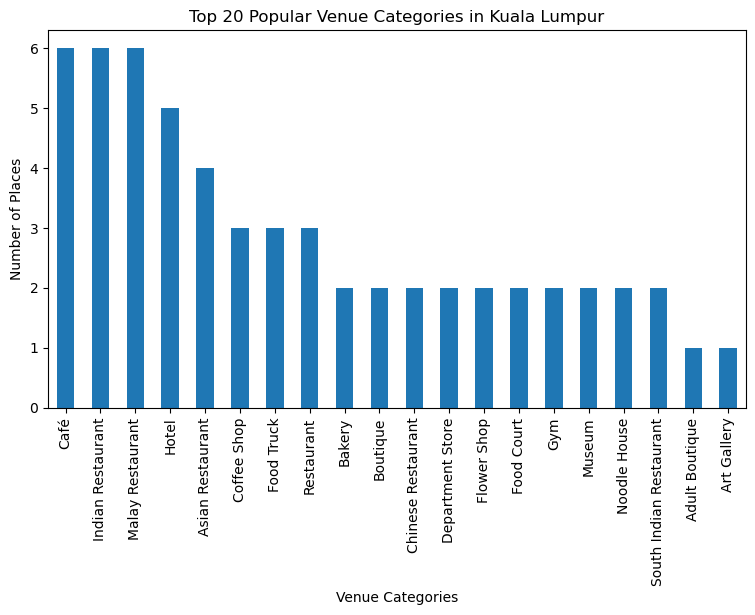

In [33]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('Top 20 Popular Venue Categories in Kuala Lumpur')
#On x-axis

#giving a bar plot
df.groupby('categories')['categories'].count().nlargest(20).plot(kind='bar')

plt.xlabel('Venue Categories')
#On y-axis
plt.ylabel('Number of Places')

#displays the plot
plt.show()

#### 6.3 Most Popular Coffee Venues in the center of kuala Lumpur

Since among our objective is to look into places to open the cafe, lets have a look in a glance the most popular Cafe' in the centre of Kuala Lumpur

In [34]:
df[(df["categories"] == 'Café') | (df["categories"] == "Coffee Shop")]

,name,categories,lat,lng,id,Rating
13,Secret Recipe,Café,3.152181,101.694910,4e6ead85c65b6d433a9b487e,7.4
25,Starbucks,Coffee Shop,3.156740,101.695815,59af878fc824ae658b21e9b0,7.9
34,Starbucks,Coffee Shop,3.155607,101.695492,5423e818498e6b80157b2274,7.4
42,LOKL Coffee Co,Café,3.148865,101.698036,4fa20eeee4b0b50902b2adc4,7.5
49,'Q' Cafe,Café,3.152207,101.695007,59bf4da00c9f3164ce7829fd,6.9
74,Starbucks,Coffee Shop,3.147224,101.699555,4bb31152a32876b0644801fe,7.4
75,Seniman Kakao,Café,3.146492,101.701148,5c60ffe1029a550039d0dbdb,7.8
77,BNM Lanai Kijang Staff Centre Cafe,Café,3.154295,101.687188,4d3fad5ede17a093a588f16b,7.5
93,Gloria Jean's Coffees,Café,3.153406,101.694795,504d4b3be4b05828d1dd68c1,6.5


Let's put these Coffee establishment on the map

In [35]:
df_cafe=df[(df["categories"] == 'Café') | (df["categories"] == "Coffee Shop")]
# create map of KL using latitude and longitude values
map_KL = folium.Map(location=[latitude, longitude], zoom_start=15)

# add markers to map
for lat, lng, location, postcode, rating in zip(df_cafe['lat'], df_cafe['lng'], df_cafe['name'], df_cafe['categories'], df_cafe['Rating']):
    label = '{}, {}, {}'.format(location, postcode,rating)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_KL)  
    
map_KL

#### 6.4 Venue category with highest Scoring in Kuala Lumpur city centre

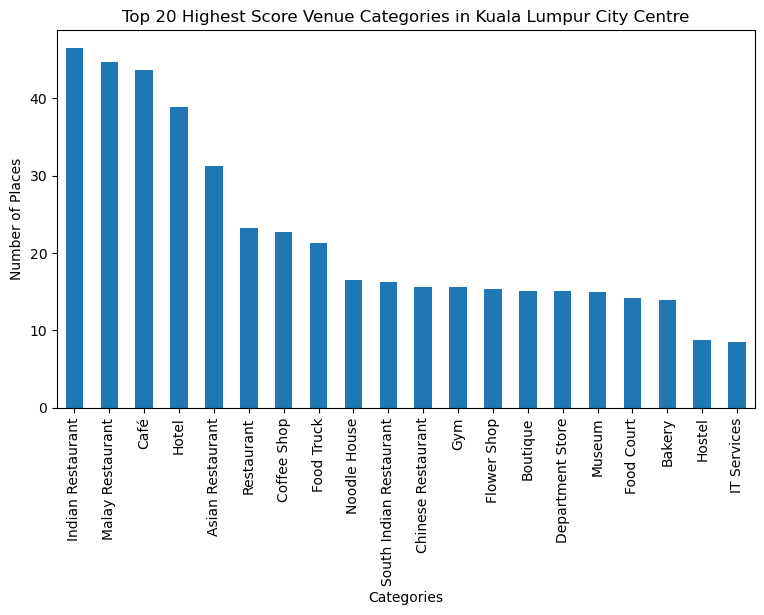

In [36]:
import matplotlib.pyplot as plt
plt.figure(figsize=(9,5), dpi = 100)
# title
plt.title('Top 20 Highest Score Venue Categories in Kuala Lumpur City Centre')
#On x-axis

#giving a bar plot
df.groupby('categories')['Rating'].sum().nlargest(20).plot(kind='bar')

plt.xlabel('Categories')
#On y-axis
plt.ylabel('Number of Places')

#displays the plot
plt.show()

It seems that Indian reataurant, Malay restaurants and Cafe are the top 3 best places in the Kuala Lumpur city center. Let's list out those venues

In [37]:
df[(df["categories"] == 'Indian Restaurant') | (df["categories"] == "Malay Restaurant") |(df["categories"] == "Café")]

,name,categories,lat,lng,id,Rating
1,Restoran Jai Hind,Indian Restaurant,3.151061,101.696074,4c4260aae26920a1360a60e7,8.0
13,Secret Recipe,Café,3.152181,101.694910,4e6ead85c65b6d433a9b487e,7.4
16,Bakti Woodlands Vegetarian Restaurant,Indian Restaurant,3.149040,101.697254,4b7cc370f964a52091a42fe3,7.9
18,Saravanaa Bhavan,Indian Restaurant,3.149231,101.697475,52365b2111d2bbb2f76ffd7d,7.9
19,Selangor Mansion Roti Banjir Special,Indian Restaurant,3.151982,101.697446,4c8bb6b91eafb1f7793f8635,7.7
29,Saravanaa Bhavan,Indian Restaurant,3.152481,101.697300,4c132365a5eb76b05d8dbfb7,7.4
36,Restoran Rebung Chef Ismail,Malay Restaurant,3.147904,101.687155,568f62c5498e7119a6f6c5d5,8.5
42,LOKL Coffee Co,Café,3.148865,101.698036,4fa20eeee4b0b50902b2adc4,7.5
49,'Q' Cafe,Café,3.152207,101.695007,59bf4da00c9f3164ce7829fd,6.9
51,Ketapang Corner,Malay Restaurant,3.157735,101.698099,50692818498e82405fe0cb34,7.7


### 7. Analyze each Kuala Lumpur Key Area

Now we will go to the the analysis on Kuala Lumpur as overall. To do this, we will extract all top venues nearby our Key Area within the radius of 2KM from the centroid.

In [38]:
def getNearbyVenues(names, latitudes, longitudes, radius=2000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Area', 
                  'Area Latitude', 
                  'Area Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

KL_venues = getNearbyVenues(names=df1['Area'],
                                   latitudes=df1['Latitude'],
                                   longitudes=df1['Longitude']
                                  )

Mid Valley City
Mont Kiara
Danau Kota
KLCC
Royal Selangor Golf Club
Kampung Berembang
Pekeliling
Pusat Bandaraya
Taman Bukit Pantai
Jalan Ipoh
Brickfields
Chow Kit
Kampung Datuk Keramat
Bukit Bintang
Taman Cheras Makmur
Taman Desa
Sentul
Desa Pandan
Pudu
Bukit Damansara
Bandar Tun Razak
Bukit Jalil
Taman Alam Damai
Batu 4 1/2 Jalan Ipoh
Taman Pertama
Kampung Cheras Baru
Bandar Sri Permaisuri
Bangsar
Kampung Baru
Taman Koperasi Polis
Kuchai Entrepreneurs Park
Metro Prima
Salak Selatan
Segambut
Pantai Dalam
Taman Sri Rampai
Taman Seri Sentosa
Taman Tun Dr. Ismail
Jinjang Utara
Kampung Pandan Luar
Taman Bukit Maluri
Bandar Baru Sentul
Kawasan Perindustrian Setapak
Pekan Sungai Besi
Tasik Perdana


Get the shape of the data

In [39]:
print(KL_venues.shape)
KL_venues.head()

(4476, 7)


,Area,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Mid Valley City,3.11768,101.67646,The Gardens Mall,3.118962,101.675956,Shopping Mall
1,Mid Valley City,3.11768,101.67646,Mid Valley Megamall,3.117784,101.677219,Shopping Mall
2,Mid Valley City,3.11768,101.67646,Jaya Grocer,3.118486,101.675710,Supermarket
3,Mid Valley City,3.11768,101.67646,Agrain By Hale,3.119776,101.676707,Poke Place
4,Mid Valley City,3.11768,101.67646,Garrett Popcorn Shops,3.118074,101.676686,Snack Place


Checking number of venues returned for each area

In [40]:
KL_venues.groupby('Area').count()

,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Area,,,,,,
Bandar Baru Sentul,100,100,100,100,100,100
Bandar Sri Permaisuri,100,100,100,100,100,100
Bandar Tun Razak,100,100,100,100,100,100
Bangsar,100,100,100,100,100,100
Batu 4 1/2 Jalan Ipoh,100,100,100,100,100,100
Brickfields,100,100,100,100,100,100
Bukit Bintang,100,100,100,100,100,100
Bukit Damansara,100,100,100,100,100,100
Bukit Jalil,100,100,100,100,100,100


####  7.1 Analyzing number of unique Venue category from the list

In [41]:
print('There are {} uniques categories.'.format(len(KL_venues['Venue Category'].unique())))

There are 297 uniques categories.


#### 7.2 Initiate detailed analysis on the key area and its surround

We start with implementing one-hot encoding

In [42]:
# one hot encoding
KL_onehot = pd.get_dummies(KL_venues[['Venue Category']], prefix="", prefix_sep="")
# get _dummies= Convert categorical variable into dummy/indicator variables.

# add Area column back to dataframe
KL_onehot['Area'] = KL_venues['Area'] 

# move Area column to the first column
col_name="Area"
first_col = KL_onehot.pop(col_name)
KL_onehot.insert(0, col_name, first_col)

KL_onehot.head()

,Area,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Aquarium,Arcade,Art Gallery,Art Museum,...,Video Game Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yakitori Restaurant,Yoga Studio
0,Mid Valley City,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,Mid Valley City,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,Mid Valley City,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,Mid Valley City,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,Mid Valley City,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


Let's examine the size of onehot dataframe

In [43]:
KL_onehot.shape

(4476, 298)

#### 7.2 Group the rows by Area and taking the mean of the frequency of occurrence of each category

In [44]:
KL_grouped = KL_onehot.groupby('Area').mean().reset_index()
KL_grouped

,Area,Accessories Store,Adult Boutique,Afghan Restaurant,African Restaurant,American Restaurant,Aquarium,Arcade,Art Gallery,Art Museum,...,Video Game Store,Vietnamese Restaurant,Volleyball Court,Warehouse Store,Whisky Bar,Wine Bar,Wings Joint,Women's Store,Yakitori Restaurant,Yoga Studio
0,Bandar Baru Sentul,0.00,0.00,0.00,0.00,0.00,0.00,0.010000,0.01,0.00,...,0.00,0.000000,0.01,0.01,0.00,0.00,0.00,0.00,0.00,0.00
1,Bandar Sri Permaisuri,0.01,0.00,0.00,0.00,0.00,0.00,0.000000,0.01,0.00,...,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
2,Bandar Tun Razak,0.01,0.00,0.00,0.00,0.00,0.00,0.000000,0.01,0.00,...,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
3,Bangsar,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,...,0.00,0.000000,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.02
4,Batu 4 1/2 Jalan Ipoh,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,...,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
5,Brickfields,0.00,0.00,0.00,0.01,0.00,0.00,0.000000,0.00,0.00,...,0.00,0.000000,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.02
6,Bukit Bintang,0.00,0.00,0.00,0.00,0.00,0.01,0.000000,0.00,0.00,...,0.00,0.010000,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.00
7,Bukit Damansara,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.01,0.00,...,0.00,0.000000,0.00,0.00,0.00,0.03,0.00,0.00,0.00,0.03
8,Bukit Jalil,0.00,0.00,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,...,0.00,0.010000,0.00,0.00,0.00,0.01,0.00,0.00,0.00,0.00
9,Chow Kit,0.00,0.01,0.00,0.00,0.00,0.00,0.000000,0.01,0.00,...,0.00,0.000000,0.00,0.01,0.00,0.00,0.00,0.00,0.00,0.00


Get the new dataframe size

In [45]:
print("The new size is {}".format(KL_grouped.shape))

The new size is (45, 298)


### 8. KL Area with top 5 most common venues

In [46]:
num_top_venues = 5

for Area in KL_grouped['Area']:
    print("----"+Area+"----")
    temp = KL_grouped[KL_grouped['Area'] == Area].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----Bandar Baru Sentul----
                venue  freq
0    Malay Restaurant  0.08
1  Chinese Restaurant  0.06
2    Asian Restaurant  0.06
3   Indian Restaurant  0.05
4     Motorcycle Shop  0.05


----Bandar Sri Permaisuri----
                  venue  freq
0    Chinese Restaurant  0.15
1      Asian Restaurant  0.06
2      Malay Restaurant  0.05
3     Convenience Store  0.05
4  Fast Food Restaurant  0.04


----Bandar Tun Razak----
                venue  freq
0  Chinese Restaurant  0.17
1    Malay Restaurant  0.07
2    Asian Restaurant  0.07
3          Food Truck  0.05
4         Flea Market  0.03


----Bangsar----
               venue  freq
0  Indian Restaurant  0.07
1              Hotel  0.06
2      Shopping Mall  0.06
3               Café  0.05
4     Clothing Store  0.04


----Batu 4 1/2 Jalan Ipoh----
                venue  freq
0  Chinese Restaurant  0.21
1    Malay Restaurant  0.11
2    Asian Restaurant  0.06
3          Food Truck  0.06
4  Seafood Restaurant  0.05


----Brickfields-

#### 8.1Transfer the result into pd dataframe

Setup function that sort the venue in descending order

In [47]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Create the new dataframe that shows 10 most popular venue

In [48]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Area']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
KL_venues_sorted = pd.DataFrame(columns=columns)
KL_venues_sorted['Area'] = KL_grouped['Area']

for ind in np.arange(KL_grouped.shape[0]):
    KL_venues_sorted.iloc[ind, 1:] = return_most_common_venues(KL_grouped.iloc[ind, :], num_top_venues)

KL_venues_sorted.head()

,Area,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Bandar Baru Sentul,Malay Restaurant,Asian Restaurant,Chinese Restaurant,Indian Restaurant,Motorcycle Shop,Hotel,Café,Coffee Shop,Thai Restaurant,Clothing Store
1,Bandar Sri Permaisuri,Chinese Restaurant,Asian Restaurant,Malay Restaurant,Convenience Store,Pizza Place,Fast Food Restaurant,Indonesian Restaurant,Gas Station,Flea Market,Food Truck
2,Bandar Tun Razak,Chinese Restaurant,Asian Restaurant,Malay Restaurant,Food Truck,Seafood Restaurant,Pizza Place,Japanese Restaurant,Flea Market,Indonesian Restaurant,Breakfast Spot
3,Bangsar,Indian Restaurant,Hotel,Shopping Mall,Café,Clothing Store,French Restaurant,Ice Cream Shop,Coffee Shop,South Indian Restaurant,Supermarket
4,Batu 4 1/2 Jalan Ipoh,Chinese Restaurant,Malay Restaurant,Asian Restaurant,Food Truck,Seafood Restaurant,Restaurant,Convenience Store,Pizza Place,Café,Indian Restaurant


### 9. Cluster Area

In [49]:
KL_grouped_clustering=KL_grouped.drop(['Area'], axis = 1)

Let's find the optimum K using elbow method

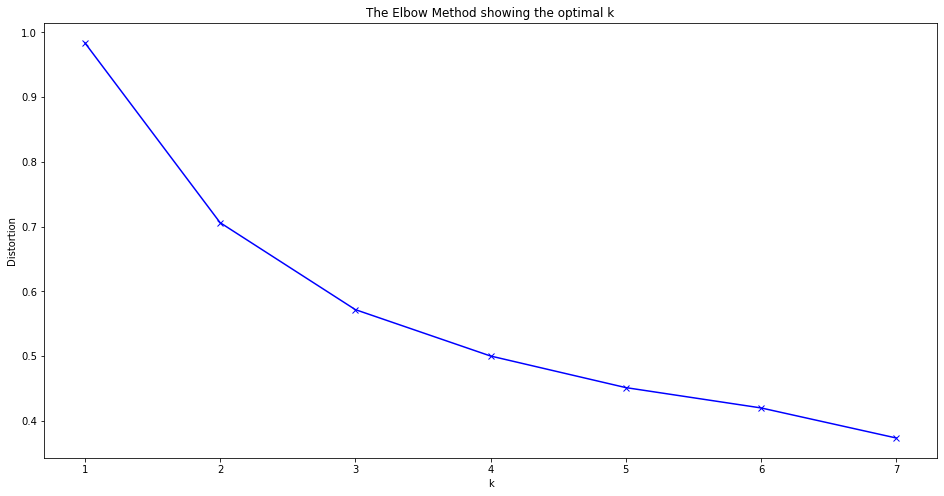

In [50]:
distortions = []
K = range(1,8)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(KL_grouped_clustering)
    distortions.append(kmeanModel.inertia_)

plt.figure(figsize=(16,8))
plt.plot(K, distortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

We can observe that the “elbow” is not very clear. To ascertain this, we will proceed with further analysis to find optimal number of K.

For this, we will use Silhouette Score to further determine the number of K.

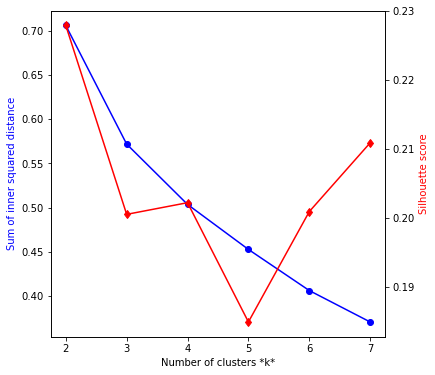

In [51]:
# Evaluate KMeans first to choose K
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.metrics import silhouette_score


sse = []
sil = []
list_k = list(range(2, 8))

for k in list_k:
    km = KMeans(n_clusters=k, random_state=0)
    km.fit(KL_grouped_clustering)
    sse.append(km.inertia_)
    sil.append(silhouette_score(KL_grouped_clustering, km.labels_))

fig, ax1 = plt.subplots(figsize=(6, 6))

ax2 = ax1.twinx()
ax1.plot(list_k, sse, 'bo-')
ax2.plot(list_k, sil, 'rd-')

ax1.set_xlabel(r'Number of clusters *k*')
ax1.set_ylabel('Sum of inner squared distance', color='b')
ax2.set_ylabel('Silhouette score', color='r')

plt.show()

From the figure, we can see Sum of Squared Distance going down when K becomes bigger. As observed, Silhouette Score is inconsistent for different number of K. Despite the result of Elbow Method, We Choose K=7 for this project since it has lowest SSE and considerably high silhoutte score.

We will run K-means to cluster the Area into 4 clusters

In [52]:
# set number of clusters
kclusters = 7

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(KL_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 0, 0, 6, 0, 6, 2, 4, 4, 2])

Create new dataframe that includes the cluster as well as the top 10 venues for each Area.

In [53]:
# add clustering labels
KL_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

KL_merged = df1

# merge manhattan_grouped with manhattan_data to add latitude/longitude for each neighborhood
KL_merged = KL_merged.join(KL_venues_sorted.set_index('Area'), on='Area')

KL_merged.head() # check the last columns!

,Area,Clinic/Hospital,Address,City,State,Latitude,Longitude,LongLat,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Mid Valley City,iHEAL Medical Centre,"Level 7 & 8, Annexe Block, Menara IGB, Lingkar...",Kuala Lumpur,Wilayah Persekutuan,3.11768,101.67646,"3.11768,101.67646",6,Ice Cream Shop,Japanese Restaurant,Juice Bar,Indian Restaurant,Cosmetics Shop,Clothing Store,Coffee Shop,Food Court,Bakery,Café
1,Mont Kiara,Global Doctors Hospital,"18, Jln Kiara 3, Mont Kiara, 50480 Kuala Lumpu...",Kuala Lumpur,Wilayah Persekutuan,3.17005,101.64895,"3.17005,101.64895",4,Japanese Restaurant,Café,Korean Restaurant,Ice Cream Shop,Restaurant,Yoga Studio,Spa,Shopping Mall,Bakery,Coffee Shop
2,Danau Kota,Columbia Asia Hospital - Setapak,"No. 1, Jalan Danau Saujana, Taman Danau Kota, ...",Setapak,Wilayah Persekutuan,3.20127,101.71817,"3.20127,101.71817",0,Chinese Restaurant,Asian Restaurant,Thai Restaurant,Malay Restaurant,Convenience Store,Coffee Shop,Ice Cream Shop,Steakhouse,Dessert Shop,Clothing Store
3,KLCC,Prince Court Medical Centre,"39, Jalan Kia Peng, Kuala Lumpur, 50450 Kuala ...",Kuala Lumpur,Wilayah Persekutuan,3.15000,101.72177,"3.15,101.72177",2,Hotel,Boutique,Japanese Restaurant,Cosmetics Shop,Clothing Store,Café,Hotel Bar,Lounge,Middle Eastern Restaurant,Shopping Mall
4,Royal Selangor Golf Club,ALPS Medical Centre,"Menara See Hoy Chan, 02-03 and 02-04, 374, Jln...",Kuala Lumpur,Wilayah Persekutuan,3.14907,101.72341,"3.14907,101.72341",2,Hotel,Boutique,Café,Cosmetics Shop,Clothing Store,Shopping Mall,Hotel Bar,Bar,Japanese Restaurant,Middle Eastern Restaurant


Let's visualize the resulting clusters

In [62]:
# create map
map_clusters1 = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(KL_merged['Latitude'], KL_merged['Longitude'], KL_merged['Area'], KL_merged['Cluster Labels']+1):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=10,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.6).add_to(map_clusters1)
    folium.GeoJson(KL_geojson, style_function=boroughs_style, name='geojson').add_to(map_clusters1)
    folium.TileLayer('cartodbpositron').add_to(map_clusters1) #cartodbpositron cartodbdark_matter
    
map_clusters1

#### 9.1 Examining Cluster

In this section, we will analyze the trend for each cluster in details

#### Cluster 1

In [63]:
x=KL_merged.loc[KL_merged['Cluster Labels'] == 0]
x.drop(['Clinic/Hospital','Address','City','State','Latitude','Longitude','LongLat'], axis = 1)

,Area,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,Danau Kota,0,Chinese Restaurant,Asian Restaurant,Thai Restaurant,Malay Restaurant,Convenience Store,Coffee Shop,Ice Cream Shop,Steakhouse,Dessert Shop,Clothing Store
20,Bandar Tun Razak,0,Chinese Restaurant,Asian Restaurant,Malay Restaurant,Food Truck,Seafood Restaurant,Pizza Place,Japanese Restaurant,Flea Market,Indonesian Restaurant,Breakfast Spot
22,Taman Alam Damai,0,Chinese Restaurant,Malay Restaurant,Coffee Shop,Indian Restaurant,Café,Noodle House,Steakhouse,Convenience Store,Asian Restaurant,Restaurant
23,Batu 4 1/2 Jalan Ipoh,0,Chinese Restaurant,Malay Restaurant,Asian Restaurant,Food Truck,Seafood Restaurant,Restaurant,Convenience Store,Pizza Place,Café,Indian Restaurant
24,Taman Pertama,0,Chinese Restaurant,Asian Restaurant,Malay Restaurant,Coffee Shop,Café,Furniture / Home Store,Market,Burger Joint,Seafood Restaurant,Vegetarian / Vegan Restaurant
26,Bandar Sri Permaisuri,0,Chinese Restaurant,Asian Restaurant,Malay Restaurant,Convenience Store,Pizza Place,Fast Food Restaurant,Indonesian Restaurant,Gas Station,Flea Market,Food Truck
32,Salak Selatan,0,Chinese Restaurant,Convenience Store,Indian Restaurant,Asian Restaurant,Malay Restaurant,Restaurant,Indonesian Restaurant,Thai Restaurant,Fast Food Restaurant,Seafood Restaurant
35,Taman Sri Rampai,0,Malay Restaurant,Chinese Restaurant,Coffee Shop,Food Court,Asian Restaurant,Food Truck,Thai Restaurant,Bubble Tea Shop,Bookstore,Convenience Store
36,Taman Seri Sentosa,0,Malay Restaurant,Chinese Restaurant,Café,Indian Restaurant,Coffee Shop,Asian Restaurant,Bakery,Vegetarian / Vegan Restaurant,Burger Joint,Thai Restaurant
42,Kawasan Perindustrian Setapak,0,Chinese Restaurant,Asian Restaurant,Coffee Shop,Malay Restaurant,Ice Cream Shop,Thai Restaurant,Bubble Tea Shop,Convenience Store,Breakfast Spot,Café


Top venues from this cluster are mainly consists of Chinese and Malay resturants. Further, Asian estaurants are at the top of 2nd common venues for this cluster. Let's visualize the most common venue with a pie chart

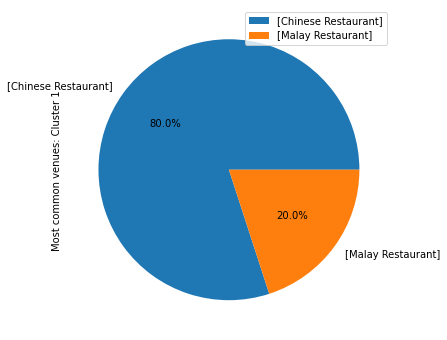

In [64]:
KL_merged_1=KL_merged[(KL_merged["Cluster Labels"] == 0)]
                       
df = pd.DataFrame({'Most common venues: Cluster 1': KL_merged_1.groupby('1st Most Common Venue')['1st Most Common Venue'].count()},
                  index= KL_merged_1.groupby('1st Most Common Venue')['1st Most Common Venue'].unique())
plot = df.plot.pie(y='Most common venues: Cluster 1', figsize=(11, 6),autopct='%1.1f%%')

Let's visualize 2nd most common venues for the cluster

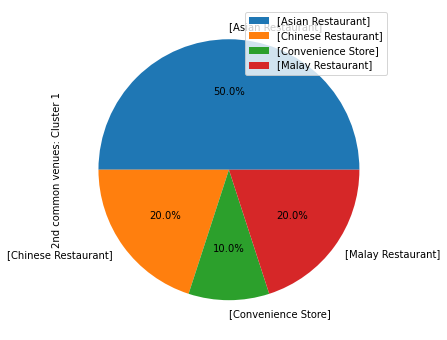

In [65]:
KL_merged_2=KL_merged[(KL_merged["Cluster Labels"] == 0)]
                       
df = pd.DataFrame({'2nd common venues: Cluster 1': KL_merged_2.groupby('2nd Most Common Venue')['2nd Most Common Venue'].count()},
                  index= KL_merged_2.groupby('2nd Most Common Venue')['2nd Most Common Venue'].unique())
plot = df.plot.pie(y='2nd common venues: Cluster 1', figsize=(11, 6),autopct='%1.1f%%')

#### Cluster 2

In [66]:
x=KL_merged.loc[KL_merged['Cluster Labels'] == 1]
x.drop(['Clinic/Hospital','Address','City','State','Latitude','Longitude','LongLat'], axis = 1)

,Area,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
6,Pekeliling,1,Malay Restaurant,Hotel,Coffee Shop,Thai Restaurant,Motorcycle Shop,Chinese Restaurant,Asian Restaurant,Indian Restaurant,Café,Seafood Restaurant
9,Jalan Ipoh,1,Malay Restaurant,Chinese Restaurant,Indian Restaurant,Hotel,Coffee Shop,Motorcycle Shop,Thai Restaurant,Asian Restaurant,Pool,Restaurant
16,Sentul,1,Malay Restaurant,Indian Restaurant,Chinese Restaurant,Coffee Shop,Motorcycle Shop,Hotel,Asian Restaurant,Café,Seafood Restaurant,Restaurant
41,Bandar Baru Sentul,1,Malay Restaurant,Asian Restaurant,Chinese Restaurant,Indian Restaurant,Motorcycle Shop,Hotel,Café,Coffee Shop,Thai Restaurant,Clothing Store
44,Tasik Perdana,1,Café,Hotel,Malay Restaurant,Park,Indian Restaurant,Monument / Landmark,Chinese Restaurant,Hotel Bar,South Indian Restaurant,Noodle House


Top venues from this cluster are predominatly consists of Malay restaurants. Let's visualize the most common venue with a pie chart.

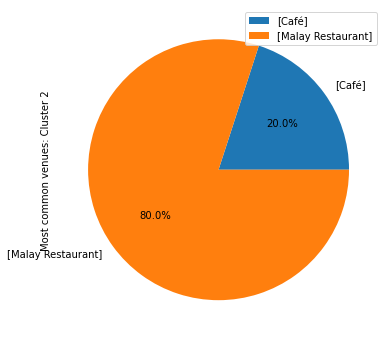

In [67]:
KL_merged_2=KL_merged[(KL_merged["Cluster Labels"] == 1)]
                       
df = pd.DataFrame({'Most common venues: Cluster 2': KL_merged_2.groupby('1st Most Common Venue')['1st Most Common Venue'].count()},
                  index= KL_merged_2.groupby('1st Most Common Venue')['1st Most Common Venue'].unique())
plot = df.plot.pie(y='Most common venues: Cluster 2', figsize=(11, 6),autopct='%1.1f%%')

Let's visualize 2nd most common venues for the cluster

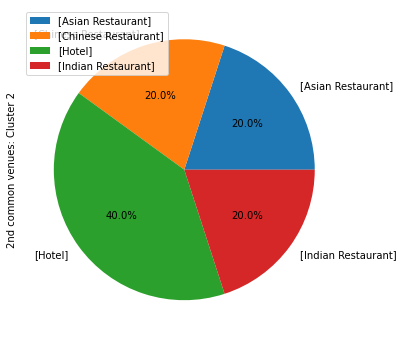

In [68]:
KL_merged_2=KL_merged[(KL_merged["Cluster Labels"] == 1)]
                       
df = pd.DataFrame({'2nd common venues: Cluster 2': KL_merged_2.groupby('2nd Most Common Venue')['2nd Most Common Venue'].count()},
                  index= KL_merged_2.groupby('2nd Most Common Venue')['2nd Most Common Venue'].unique())
plot = df.plot.pie(y='2nd common venues: Cluster 2', figsize=(11, 6),autopct='%1.1f%%')

#### Cluster 3

In [69]:
x=KL_merged.loc[KL_merged['Cluster Labels'] == 2]
x.drop(['Clinic/Hospital','Address','City','State','Latitude','Longitude','LongLat'], axis = 1)

,Area,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
3,KLCC,2,Hotel,Boutique,Japanese Restaurant,Cosmetics Shop,Clothing Store,Café,Hotel Bar,Lounge,Middle Eastern Restaurant,Shopping Mall
4,Royal Selangor Golf Club,2,Hotel,Boutique,Café,Cosmetics Shop,Clothing Store,Shopping Mall,Hotel Bar,Bar,Japanese Restaurant,Middle Eastern Restaurant
7,Pusat Bandaraya,2,Hotel,Café,Spa,Cosmetics Shop,Hostel,Bar,Clothing Store,Japanese Restaurant,Juice Bar,Shopping Mall
11,Chow Kit,2,Hotel,Malay Restaurant,Indian Restaurant,Bar,Coffee Shop,Cocktail Bar,Noodle House,Convenience Store,Monument / Landmark,Boutique
12,Kampung Datuk Keramat,2,Hotel,Coffee Shop,Clothing Store,Shopping Mall,Hotel Bar,Malay Restaurant,Cocktail Bar,Cosmetics Shop,Boutique,Café
13,Bukit Bintang,2,Hotel,Boutique,Café,Clothing Store,Sushi Restaurant,Coffee Shop,Cosmetics Shop,Middle Eastern Restaurant,Japanese Restaurant,Bar
18,Pudu,2,Chinese Restaurant,Hotel,Café,Japanese Restaurant,Clothing Store,Cosmetics Shop,Spa,Boutique,Lounge,Middle Eastern Restaurant
28,Kampung Baru,2,Hotel,Malay Restaurant,Clothing Store,Coffee Shop,Shopping Mall,Hotel Bar,Seafood Restaurant,Cosmetics Shop,Boutique,Fountain


Top venues from this cluster are predominatly consists of Hotels. Second most common venues are boutique and Malay restaurant. Let's visualize the most common venue with a pie chart

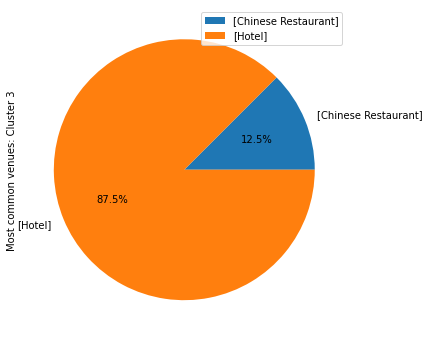

In [70]:
KL_merged_3=KL_merged[(KL_merged["Cluster Labels"] == 2)]
                       
df = pd.DataFrame({'Most common venues: Cluster 3': KL_merged_3.groupby('1st Most Common Venue')['1st Most Common Venue'].count()},
                  index= KL_merged_3.groupby('1st Most Common Venue')['1st Most Common Venue'].unique())
plot = df.plot.pie(y='Most common venues: Cluster 3', figsize=(11, 6),autopct='%1.1f%%')

Let's visualize 2nd most common venues for the cluster

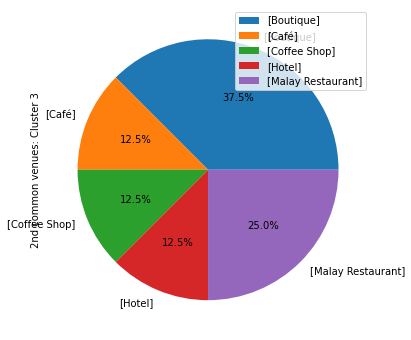

In [71]:
KL_merged_3=KL_merged[(KL_merged["Cluster Labels"] == 2)]
                       
df = pd.DataFrame({'2nd common venues: Cluster 3': KL_merged_3.groupby('2nd Most Common Venue')['2nd Most Common Venue'].count()},
                  index= KL_merged_3.groupby('2nd Most Common Venue')['2nd Most Common Venue'].unique())
plot = df.plot.pie(y='2nd common venues: Cluster 3', figsize=(11, 6),autopct='%1.1f%%')

#### Cluster 4

In [72]:
x=KL_merged.loc[KL_merged['Cluster Labels'] == 3]
x.drop(['Clinic/Hospital','Address','City','State','Latitude','Longitude','LongLat'], axis = 1)

,Area,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
14,Taman Cheras Makmur,3,Chinese Restaurant,Café,Asian Restaurant,Seafood Restaurant,Coffee Shop,Thai Restaurant,Noodle House,Spa,Breakfast Spot,Restaurant
15,Taman Desa,3,Chinese Restaurant,Café,Asian Restaurant,Japanese Restaurant,Malay Restaurant,Pet Store,Restaurant,Convenience Store,Food Truck,Coffee Shop
25,Kampung Cheras Baru,3,Chinese Restaurant,Seafood Restaurant,Café,Malay Restaurant,Asian Restaurant,Thai Restaurant,Convenience Store,Restaurant,Coffee Shop,Halal Restaurant
30,Kuchai Entrepreneurs Park,3,Chinese Restaurant,Café,Asian Restaurant,Japanese Restaurant,Korean Restaurant,Food Truck,Noodle House,Coffee Shop,Vegetarian / Vegan Restaurant,Dessert Shop
31,Metro Prima,3,Chinese Restaurant,Asian Restaurant,Dessert Shop,Restaurant,Coffee Shop,Seafood Restaurant,Noodle House,Vegetarian / Vegan Restaurant,Food Court,Bubble Tea Shop
34,Pantai Dalam,3,Chinese Restaurant,Café,Japanese Restaurant,Asian Restaurant,Indian Restaurant,Pet Store,Malay Restaurant,Restaurant,Convenience Store,Spa
38,Jinjang Utara,3,Chinese Restaurant,Asian Restaurant,Vegetarian / Vegan Restaurant,Seafood Restaurant,Coffee Shop,Dessert Shop,Restaurant,Accessories Store,Thai Restaurant,Café
40,Taman Bukit Maluri,3,Chinese Restaurant,Asian Restaurant,Coffee Shop,Dessert Shop,Vegetarian / Vegan Restaurant,Food Truck,Café,Ice Cream Shop,Park,Gym


Top venues from this cluster are predominatly consists of Chinese restaurants. Second most common venues are Cafe, Asian and Seafood restaurants. Let's visualize the most common venue with a pie chart

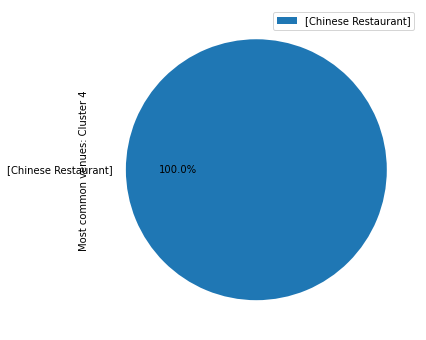

In [73]:
KL_merged_4=KL_merged[(KL_merged["Cluster Labels"] == 3)]
                       
df = pd.DataFrame({'Most common venues: Cluster 4': KL_merged_4.groupby('1st Most Common Venue')['1st Most Common Venue'].count()},
                  index= KL_merged_4.groupby('1st Most Common Venue')['1st Most Common Venue'].unique())
plot = df.plot.pie(y='Most common venues: Cluster 4', figsize=(11, 6),autopct='%1.1f%%')

Let's visualize 2nd most common venues for the cluster

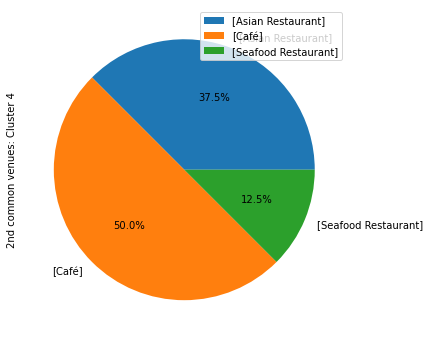

In [74]:
KL_merged_4=KL_merged[(KL_merged["Cluster Labels"] == 3)]
                       
df = pd.DataFrame({'2nd common venues: Cluster 4': KL_merged_4.groupby('2nd Most Common Venue')['2nd Most Common Venue'].count()},
                  index= KL_merged_4.groupby('2nd Most Common Venue')['2nd Most Common Venue'].unique())
plot = df.plot.pie(y='2nd common venues: Cluster 4', figsize=(11, 6),autopct='%1.1f%%')

#### Cluster 5

In [75]:
x=KL_merged.loc[KL_merged['Cluster Labels'] == 4]
x.drop(['Clinic/Hospital','Address','City','State','Latitude','Longitude','LongLat'], axis = 1)

,Area,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
1,Mont Kiara,4,Japanese Restaurant,Café,Korean Restaurant,Ice Cream Shop,Restaurant,Yoga Studio,Spa,Shopping Mall,Bakery,Coffee Shop
19,Bukit Damansara,4,Japanese Restaurant,Spa,Café,Ice Cream Shop,Grocery Store,Korean Restaurant,Thai Restaurant,Bakery,Italian Restaurant,Yoga Studio
21,Bukit Jalil,4,Café,Chinese Restaurant,Convenience Store,Japanese Restaurant,Coffee Shop,Golf Course,Stadium,Halal Restaurant,Malay Restaurant,Asian Restaurant
33,Segambut,4,Chinese Restaurant,Japanese Restaurant,Café,Asian Restaurant,Spa,Restaurant,Korean Restaurant,Coffee Shop,Malay Restaurant,Noodle House
37,Taman Tun Dr. Ismail,4,Ice Cream Shop,Dessert Shop,Café,Chinese Restaurant,Bakery,Burger Joint,Asian Restaurant,Convenience Store,Malay Restaurant,Movie Theater
43,Pekan Sungai Besi,4,Chinese Restaurant,Asian Restaurant,Burger Joint,Coffee Shop,Malay Restaurant,Japanese Restaurant,Hotpot Restaurant,Café,Massage Studio,Korean Restaurant


Top venues from this cluster are consists of Japanese restaurants, Chinese restaurants, Café and Ice Cream Shops . Let's visualize the most common venue with a pie chart.

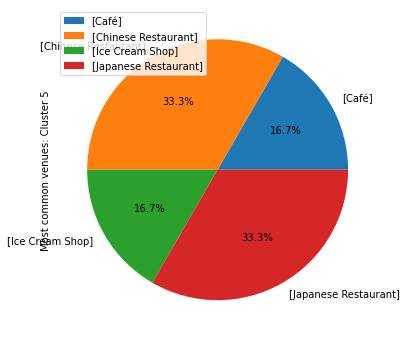

In [76]:
KL_merged_4=KL_merged[(KL_merged["Cluster Labels"] == 4)]
                       
df = pd.DataFrame({'Most common venues: Cluster 5': KL_merged_4.groupby('1st Most Common Venue')['1st Most Common Venue'].count()},
                  index= KL_merged_4.groupby('1st Most Common Venue')['1st Most Common Venue'].unique())
plot = df.plot.pie(y='Most common venues: Cluster 5', figsize=(11, 6),autopct='%1.1f%%')

Let's visualize 2nd most common venues for the cluster

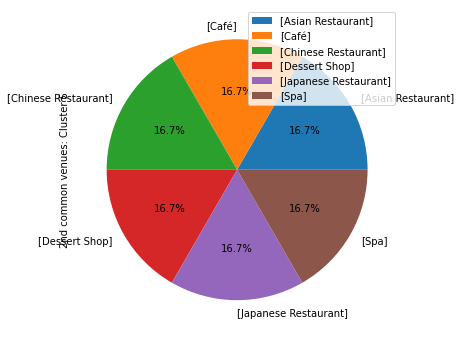

In [77]:
KL_merged_4=KL_merged[(KL_merged["Cluster Labels"] == 4)]
                       
df = pd.DataFrame({'2nd common venues: Cluster 5': KL_merged_4.groupby('2nd Most Common Venue')['2nd Most Common Venue'].count()},
                  index= KL_merged_4.groupby('2nd Most Common Venue')['2nd Most Common Venue'].unique())
plot = df.plot.pie(y='2nd common venues: Cluster 5', figsize=(11, 6),autopct='%1.1f%%')

#### Cluster 6

In [78]:
x=KL_merged.loc[KL_merged['Cluster Labels'] == 5]
x.drop(['Clinic/Hospital','Address','City','State','Latitude','Longitude','LongLat'], axis = 1)

,Area,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
5,Kampung Berembang,5,Malay Restaurant,Coffee Shop,Asian Restaurant,Middle Eastern Restaurant,Café,Food Truck,Korean Restaurant,Juice Bar,Ice Cream Shop,Chinese Restaurant
17,Desa Pandan,5,Malay Restaurant,Asian Restaurant,Coffee Shop,Middle Eastern Restaurant,Korean Restaurant,Furniture / Home Store,Breakfast Spot,Italian Restaurant,Café,Burger Joint
29,Taman Koperasi Polis,5,Malay Restaurant,Asian Restaurant,Thai Restaurant,Convenience Store,Steakhouse,Fast Food Restaurant,Park,Snack Place,Chinese Restaurant,Seafood Restaurant
39,Kampung Pandan Luar,5,Malay Restaurant,Asian Restaurant,Coffee Shop,Middle Eastern Restaurant,Breakfast Spot,Chinese Restaurant,Korean Restaurant,Burger Joint,Grocery Store,Bistro


Top venues from this cluster are predominatly consists of Malay restaurants. Second most common venues are Asian restaurants and Cafe. Let's visualize the most common venue with a pie chart.

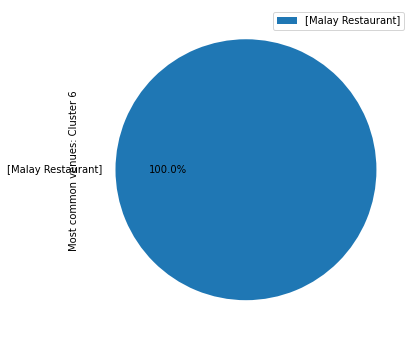

In [79]:
KL_merged_4=KL_merged[(KL_merged["Cluster Labels"] == 5)]
                       
df = pd.DataFrame({'Most common venues: Cluster 6': KL_merged_4.groupby('1st Most Common Venue')['1st Most Common Venue'].count()},
                  index= KL_merged_4.groupby('1st Most Common Venue')['1st Most Common Venue'].unique())
plot = df.plot.pie(y='Most common venues: Cluster 6', figsize=(11, 6),autopct='%1.1f%%')

Let's visualize 2nd most common venues for the cluster

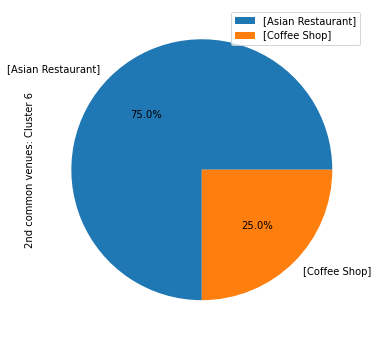

In [80]:
KL_merged_4=KL_merged[(KL_merged["Cluster Labels"] == 5)]
                       
df = pd.DataFrame({'2nd common venues: Cluster 6': KL_merged_4.groupby('2nd Most Common Venue')['2nd Most Common Venue'].count()},
                  index= KL_merged_4.groupby('2nd Most Common Venue')['2nd Most Common Venue'].unique())
plot = df.plot.pie(y='2nd common venues: Cluster 6', figsize=(11, 6),autopct='%1.1f%%')

#### Cluster 7

In [81]:
x=KL_merged.loc[KL_merged['Cluster Labels'] == 6]
x.drop(['Clinic/Hospital','Address','City','State','Latitude','Longitude','LongLat'], axis = 1)

,Area,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Mid Valley City,6,Ice Cream Shop,Japanese Restaurant,Juice Bar,Indian Restaurant,Cosmetics Shop,Clothing Store,Coffee Shop,Food Court,Bakery,Café
8,Taman Bukit Pantai,6,Indian Restaurant,Shopping Mall,Coffee Shop,Ice Cream Shop,Café,Clothing Store,Japanese Restaurant,Burger Joint,Bakery,Yoga Studio
10,Brickfields,6,Indian Restaurant,Hotel,Clothing Store,Café,Shopping Mall,Hotel Bar,Ice Cream Shop,Spa,French Restaurant,Coffee Shop
27,Bangsar,6,Indian Restaurant,Hotel,Shopping Mall,Café,Clothing Store,French Restaurant,Ice Cream Shop,Coffee Shop,South Indian Restaurant,Supermarket


Top venues from this cluster are predominatly consists of Indian restaurants, and Ice-cream shops. Let's visualize the most common venue with a pie chart.

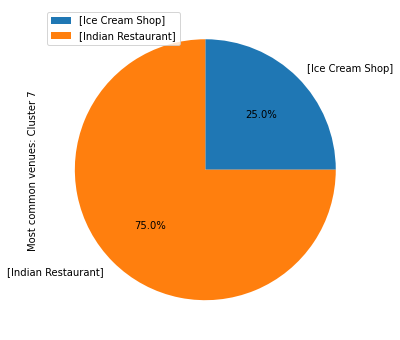

In [82]:
KL_merged_4=KL_merged[(KL_merged["Cluster Labels"] == 6)]
                       
df = pd.DataFrame({'Most common venues: Cluster 7': KL_merged_4.groupby('1st Most Common Venue')['1st Most Common Venue'].count()},
                  index= KL_merged_4.groupby('1st Most Common Venue')['1st Most Common Venue'].unique())
plot = df.plot.pie(y='Most common venues: Cluster 7', figsize=(11, 6),autopct='%1.1f%%')

Let's visualize 2nd most common venues for the cluster

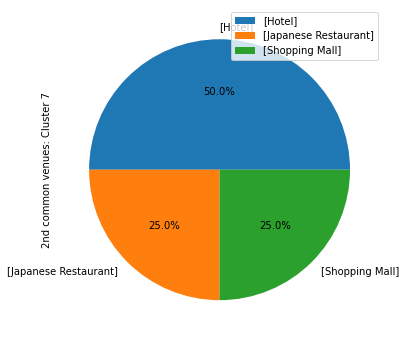

In [83]:
KL_merged_4=KL_merged[(KL_merged["Cluster Labels"] == 6)]
                       
df = pd.DataFrame({'2nd common venues: Cluster 7': KL_merged_4.groupby('2nd Most Common Venue')['2nd Most Common Venue'].count()},
                  index= KL_merged_4.groupby('2nd Most Common Venue')['2nd Most Common Venue'].unique())
plot = df.plot.pie(y='2nd common venues: Cluster 7', figsize=(11, 6),autopct='%1.1f%%')

### 10. Where to open a Cafe in Kuala Lumpur?

As part of our main objective, we are looking for suitable places to open up of Café in Kuala Lumpur. We will filter the KL_venues data for this purpose

In [84]:
KL_geojson_url = 'https://raw.githubusercontent.com/TindakMalaysia/Federal-Territories-Maps/master/KL/KL_PBT_2015/Kuala_Lumpur_PBT_2015.geojson'
KL_geojson = requests.get(KL_geojson_url).json()

def boroughs_style(feature):
    return { 'color': 'blue', 'fill': False }

In [85]:
KL_coffee_venues= KL_venues[(KL_venues["Venue Category"] == "Café") | (KL_venues["Venue Category"] == "Coffee Shop")]

Let's overlay it on the existing cluster map

In [86]:
for lat, lng, venue, category in zip(KL_coffee_venues['Venue Latitude'], KL_coffee_venues['Venue Longitude'], KL_coffee_venues['Venue'], KL_coffee_venues['Venue Category']):
# The zip() function returns a zip object, 
# which is an iterator of tuples where the first item in each passed iterator is paired together, 
# and then the second item in each passed iterator are paired together etc.
# If the passed iterators have different lengths, the iterator with the least items decides the length of the new iterator.
    label = '{}, {}'.format(venue, category)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=2,
        popup=label,
        color='green',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_clusters1)
    folium.GeoJson(KL_geojson, style_function=boroughs_style, name='geojson').add_to(map_clusters1)
    
map_clusters1

Based on preliminary analyis, we could see a concentrated cafe establishment within cluster 2, 3 abnd 7. Thus, new cafe owners should avoid theses places. 

However, we noted the plot above may be not enough to conclude the safe area to open up cafe in Kuala Lumpur. This is due to Foursquare free account limitation where only 100 items can be extracted from an area/ coordinate everytime. As we were utilizing the API calls looking for other places, the number of cafe establishment extracted may have been limited as well.

For this we require to perform an API call for specific location type from foursquare.

In [87]:
cat_id=('4bf58dd8d48988d16d941735' or '4bf58dd8d48988d1e0931735')

The above category ID are extracted from Foursquare documentation: https://developer.foursquare.com/docs/build-with-foursquare/categories/

In [88]:
def getNearbycafe(names, latitudes, longitudes, radius=2000):
    
    venues_list3=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
        
        #'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'
        # create the API request URL
        url3 = 'https://api.foursquare.com/v2/venues/search?&ll={},{}&categoryId={}&client_id={}&client_secret={}&v={}&radius={}&limit={}'.format(
            lat, 
            lng,
            cat_id,
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url3).json()['response']['venues']
        
        # return only relevant information for each nearby venue
        venues_list3.append([(
            name,
            lat, 
            lng,
            v['name'], 
            (v['location']['lat']), 
            (v['location']['lng']),
            v['categories'][0]['name'],
            str(v['location']['lat'])+","+str(v['location']['lng'])) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list3 for item in venue_list])
    nearby_venues.columns = ['Area', 
                  'Area Latitude', 
                  'Area Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category', 'Longlat']
    
    return(nearby_venues)

KL_cafe = getNearbycafe(names=df1['Area'],
                                   latitudes=df1['Latitude'],
                                   longitudes=df1['Longitude']
                                  )

Mid Valley City
Mont Kiara
Danau Kota
KLCC
Royal Selangor Golf Club
Kampung Berembang
Pekeliling
Pusat Bandaraya
Taman Bukit Pantai
Jalan Ipoh
Brickfields
Chow Kit
Kampung Datuk Keramat
Bukit Bintang
Taman Cheras Makmur
Taman Desa
Sentul
Desa Pandan
Pudu
Bukit Damansara
Bandar Tun Razak
Bukit Jalil
Taman Alam Damai
Batu 4 1/2 Jalan Ipoh
Taman Pertama
Kampung Cheras Baru
Bandar Sri Permaisuri
Bangsar
Kampung Baru
Taman Koperasi Polis
Kuchai Entrepreneurs Park
Metro Prima
Salak Selatan
Segambut
Pantai Dalam
Taman Sri Rampai
Taman Seri Sentosa
Taman Tun Dr. Ismail
Jinjang Utara
Kampung Pandan Luar
Taman Bukit Maluri
Bandar Baru Sentul
Kawasan Perindustrian Setapak
Pekan Sungai Besi
Tasik Perdana


In [89]:
KL_cafe

,Area,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Longlat
0,Mid Valley City,3.11768,101.67646,Eight Ounce Coffee,3.118104,101.676550,Coffee Shop,"3.1181041173200224,101.67655030514375"
1,Mid Valley City,3.11768,101.67646,Hoshino Coffee,3.118101,101.676426,Café,"3.118101,101.676426"
2,Mid Valley City,3.11768,101.67646,DÔME Café,3.118110,101.676570,Café,"3.1181101159864393,101.67656966207332"
3,Mid Valley City,3.11768,101.67646,Antipodean,3.118212,101.676698,Breakfast Spot,"3.1182115479502444,101.67669764203372"
4,Mid Valley City,3.11768,101.67646,Boost Juice Bars,3.117984,101.676891,Juice Bar,"3.11798351207398,101.67689070378059"
...,...,...,...,...,...,...,...,...
2234,Tasik Perdana,3.14534,101.68978,Common Grind at The Row,3.158063,101.699585,Coffee Shop,"3.1580627,101.699585"
2235,Tasik Perdana,3.14534,101.68978,The Coffee Bean & Tea Leaf,3.133145,101.687530,Coffee Shop,"3.133144951264733,101.6875299105325"
2236,Tasik Perdana,3.14534,101.68978,{x} Coffee,3.136182,101.687725,Café,"3.136181634846271,101.68772486692565"
2237,Tasik Perdana,3.14534,101.68978,Coliseum Café & Grill,3.153630,101.696522,Steakhouse,"3.153629808354096,101.69652203789269"


Great! based on new API call. we suceefully extracted 2239 lines of cafe around Kuala Lumpur.

In [90]:
pd.DataFrame(KL_cafe)
KL_cafe.head()

,Area,Area Latitude,Area Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category,Longlat
0,Mid Valley City,3.11768,101.67646,Eight Ounce Coffee,3.118104,101.676550,Coffee Shop,"3.1181041173200224,101.67655030514375"
1,Mid Valley City,3.11768,101.67646,Hoshino Coffee,3.118101,101.676426,Café,"3.118101,101.676426"
2,Mid Valley City,3.11768,101.67646,DÔME Café,3.118110,101.676570,Café,"3.1181101159864393,101.67656966207332"
3,Mid Valley City,3.11768,101.67646,Antipodean,3.118212,101.676698,Breakfast Spot,"3.1182115479502444,101.67669764203372"
4,Mid Valley City,3.11768,101.67646,Boost Juice Bars,3.117984,101.676891,Juice Bar,"3.11798351207398,101.67689070378059"


let's show them on a heatmap.

In [91]:
locations = KL_cafe[['Venue Latitude', 'Venue Longitude']] 
locationlist = locations.values.tolist() 
locationlist = [[float(lat),float(lon)] for [lat,lon] in locationlist]

In [92]:
from folium import plugins
from folium.plugins import HeatMap


#[[lat[i],lon[i],js[i]] for i in range(num)]

map_KL_heat = folium.Map(location=KL_center, zoom_start=12)
folium.TileLayer('cartodbpositron').add_to(map_KL_heat) #cartodbpositron cartodbdark_matter

HeatMap(locationlist).add_to(map_KL_heat)

folium.Marker(KL_center).add_to(map_KL_heat)
folium.Circle(KL_center, radius=2000, fill=False, color='white').add_to(map_KL_heat)
folium.Circle(KL_center, radius=4000, fill=False, color='white').add_to(map_KL_heat)
folium.Circle(KL_center, radius=6000, fill=False, color='white').add_to(map_KL_heat)
folium.Circle(KL_center, radius=8000, fill=False, color='white').add_to(map_KL_heat)
folium.Circle(KL_center, radius=10000, fill=False, color='white').add_to(map_KL_heat)
folium.GeoJson(KL_geojson, style_function=boroughs_style, name='geojson').add_to(map_KL_heat)
map_KL_heat

let's show the cluster on top of the heatmap

In [93]:
# create map
map_clusters2 = folium.Map(location=[latitude, longitude], zoom_start=11.5)
folium.TileLayer('cartodbpositron').add_to(map_clusters2)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(KL_merged['Latitude'], KL_merged['Longitude'], KL_merged['Area'], KL_merged['Cluster Labels']+1):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=15,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.6).add_to(map_clusters2)
    folium.GeoJson(KL_geojson, style_function=boroughs_style, name='geojson').add_to(map_clusters2)
HeatMap(locationlist).add_to(map_clusters2)    
map_clusters2

## Final Conclusion

Based on the analysis on the heatmap, we could advise for the new cafe establishment to 
1. avoid opening café within cluster 1,2,3 and 7;
2. focus to open within cluster 4, 5 and 6 for lower number of competition;
3. Further we identified few pockets area within the heatmap where cafe owners can explore to open up their café namely Bukit Tungku, penchala, setapak, Desa Melawati and Sungai Besi. These areas seem to be less crowded and might have a very low competition.

Cluster 1,2,3 and 7 are overly crowded with café thus the competition might fierce within the area. High concentration of café within these areas are contributed with the fact that the location is situated in the middle of Kuala Lumpur City Centre.

Thus , it is wise for new café owner to consider opening their café as per our advise no. 2 and 3 above. In our opinion, competing head-on with popular, more matured establishment may sound a bad idea in the beginning. The owner of new café establishment can strategize by developing their brand and slowly moving into city centre when the timing is appropriate.